# Data Mining Project

This dataset was provided by the Paralyzed Veterans of America (PVA). PVA is a non-profit organization that provides programs and services for US veterans with spinal cord injuries or disease. PVA owns an in-house database of 13 million donors.  
Dataset consists of the results of one of PVA's recent fundraising appeals, containing 95 412 donors who made at least one prior donation to PVA.  
All donors in provided dataset are "Lapsed" donors, i.e. individuals who made their last donation to PVA 13 to 24 months ago.  
The aim of the project is to develop a Customer Segmentation which will help (1) to better understand how donors behave and (2) to build a marketing strategy to recapture lapsed donors.

__Knowledge Discovery Database (KDD) Process__
- Selection — creating a target data set, or focusing on a subset of variables or data samples that require further exploration;
- Pre-processing — target data pre-processing to obtain consistent data;
- Transformation — data transformation using dimensionality reduction or transformation methods;
- Data Mining — searching for patterns of interest in a particular representational form that depends on the Data Mining goal (e.g. prediction);
- Interpretation/Evaluation — interpretation and evaluation of the mined patterns.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import folium as folium
from folium.plugins import HeatMap,HeatMapWithTime
import pgeocode

# Change settings to display all columns
pd.options.display.max_columns = None

# Create color map
cm = sns.light_palette("green", as_cmap=True)

## Load Data

In [2]:
# Load data
data = pd.read_csv("donors.csv", low_memory=False)

In [3]:
# Preview dataset
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

## Selection

We focus on a subset of variables which will be further used to discover patterns.  
Variables are omitted mainly because of irrelevance or lack of non-null values.

### Donors

In [4]:
# General donor information: gender, age, location, etc.
general = ["TCODE", "STATE", "DOB", "DOMAIN", "HOMEOWNR", "NUMCHLD", "INCOME",
          "GENDER", "WEALTH1", "HIT", "MAJOR", "WEALTH2"]

# Number of known times the donor has responded to other types of MAIL ORDER offers
mail_order = data.loc[:,"MBCRAFT":"PUBOPP"].columns

# Donor interests collected from third-party data sources
interests = data.loc[:,"COLLECT1":"PLATES"].columns

### Neighborhood

In [5]:
# will import previously extracted coordinates in order to create a precise map
#values extracted on zip level
coordinates = pd.read_csv("coordinates.csv", low_memory=False)
#append to df
data['latitude'] = coordinates['latitude']
data['longitude'] = coordinates['longitude']
data['latitude'].fillna(90,inplace=True)             #mask na as to be living in the north pole
data['longitude'].fillna(0,inplace=True) 

In [6]:
neighborhood = ['latitude','longitude', 'POP901','POP902','POP903','POP90C1',
                'AGE901','AGE903','AGE904','HHAGE1',
                'HHP2','HV2','HU1','HU2','HU3','HU4','HU5',
                'IC3','IC4','IC5',
                'HHAS1','HHAS2','HHAS3','HHAS4',
                'LFC4','LFC5',
                'EC1','EC3',
                'AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']

### Donations

In [7]:
# Dates when promos were sent
promo_date = data.loc[:,"ADATE_2":"ADATE_24"].columns
# Actual RFA status on the moment of sending promo
promo_rfa = data.loc[:,"RFA_2":"RFA_24"].columns
# Date when donation was made as a response on a corresponding promo
gift_date = data.loc[:,"RDATE_3":"RDATE_24"].columns
# Amount of donation in dollars as a response on a corresponding promo
gift_value = data.loc[:,"RAMNT_3":"RAMNT_24"].columns

# Gift values year 2016
gift_value_16 = data.loc[:,"RAMNT_3":"RAMNT_12"].columns
# Gift values year 2015
gift_value_15 = data.loc[:,"RAMNT_13":"RAMNT_22"].columns

## Pre-processing

A couple of words about pre-processing

### General

In [8]:
# General fields before cleaning
data[general].head()

,TCODE,STATE,DOB,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MAJOR,WEALTH2
0,0,IL,1957-12-01,T2,,NaN,NaN,F,NaN,0,,5.0
1,1,CA,1972-02-01,S1,H,1.0,6.0,M,9.0,16,,9.0
2,1,NC,NaN,R2,U,NaN,3.0,M,1.0,2,,1.0
3,0,CA,1948-01-01,R2,U,NaN,1.0,F,4.0,2,,0.0
4,0,FL,1940-01-01,S2,H,1.0,3.0,F,2.0,60,,NaN


In [9]:
# Count military titles (potentially relevant if sample size is big enough)
data.TCODE.astype("str").str[:2].isin(["6","11","12","13","14","15","18","22","24","38","48","59","87","89","90"]).sum()

157

#### Gender

In [10]:
data["male"] = 0
data.loc[(data.GENDER == "M") | (data.TCODE == 1), "male"] = 1

data["female"] = 0
data.loc[(data.GENDER == "F") | (data.TCODE.isin([2, 3, 28])), "female"] = 1

data["couple"] = 0
data.loc[(data.GENDER == "J") | (data.TCODE > 1000), "couple"] = 1

general += ["male", "female", "couple"]
general.remove("GENDER")
general.remove("TCODE")

data[["male", "female", "couple"]].mean()

male      0.416908
female    0.589171
couple    0.021412
dtype: float64

#### Age

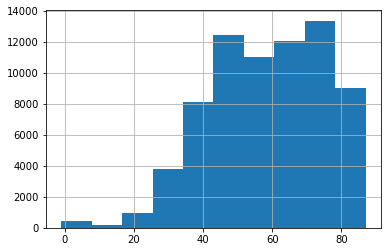

In [11]:
# Convert Date Of Birth to datetime
data["DOB"] = pd.to_datetime(data["DOB"], format="%Y-%m-%d")
# Assume current date
now = pd.to_datetime('2017-06-01')
# Calculate age
data['age'] = (now - data['DOB']).astype('<m8[Y]')

general += ["age"]
general.remove("DOB")

data.age.hist()

In [12]:
(data.age<30).mean()

0.031075755670146313

#### Urbanicity and Socio-economic status of neighborhood

In [13]:
# Urbanicity level of donor's neigborhood
data.loc[data.DOMAIN.str[:1] == "S", "urbanicity"] = "Suburban"
data.loc[data.DOMAIN.str[:1] == "R", "urbanicity"] = "Rural"
data.loc[data.DOMAIN.str[:1] == "C", "urbanicity"] = "City"
data.loc[data.DOMAIN.str[:1] == "T", "urbanicity"] = "Town"
data.loc[data.DOMAIN.str[:1] == "U", "urbanicity"] = "Urban"

general += ["urbanicity"]

data.urbanicity.value_counts(dropna=False)

Suburban    21924
Rural       19790
City        19689
Town        19527
Urban       12166
NaN          2316
Name: urbanicity, dtype: int64

In [14]:
# Socio-Economic status of donor's neighborhood
data.loc[data.DOMAIN.str[1:].str.isnumeric(), "ses"] = data.DOMAIN.str[1:]

general += ["ses"]
general.remove("DOMAIN")

# All but "Urban": 1-Highest SES, 2-Average SES, 3-Lowest SES
# "Urban": 1-Highest SES, 2-Above average SES, 3-Below average SES, 4-Lowest SES
data.ses.value_counts(dropna=False)

2      46040
1      28498
3      16754
NaN     2316
4       1804
Name: ses, dtype: int64

#### Home owner

In [15]:
# Home owner flag
data.loc[data["HOMEOWNR"] == "H", "HOMEOWNR"] = 1
data.loc[data["HOMEOWNR"] !=  1,  "HOMEOWNR"] = 0

#### Number of children

In [16]:
# Number of children
data.NUMCHLD = data.NUMCHLD.fillna(0)
data.NUMCHLD = data.NUMCHLD.astype("int")

data.NUMCHLD.value_counts()

0    83026
1     7792
2     3110
3     1101
4      316
5       59
6        7
7        1
Name: NUMCHLD, dtype: int64

#### General

In [17]:
# After cleaning general
data[general].head()

,STATE,HOMEOWNR,NUMCHLD,INCOME,WEALTH1,HIT,MAJOR,WEALTH2,male,female,couple,age,urbanicity,ses
0,IL,0,0,NaN,NaN,0,,5.0,0,1,0,59.0,Town,2
1,CA,1,1,6.0,9.0,16,,9.0,1,0,0,45.0,Suburban,1
2,NC,0,0,3.0,1.0,2,,1.0,1,0,0,NaN,Rural,2
3,CA,0,0,1.0,4.0,2,,0.0,0,1,0,69.0,Rural,2
4,FL,1,1,3.0,2.0,60,,NaN,0,1,0,77.0,Suburban,2


In [18]:
data[general].describe()

,NUMCHLD,INCOME,WEALTH1,HIT,WEALTH2,male,female,couple,age
count,95412.000000,74126.000000,50680.000000,95412.000000,51589.000000,95412.000000,95412.000000,95412.000000,71529.000000
mean,0.198329,3.886248,5.345699,3.321438,4.954525,0.416908,0.589171,0.021412,58.504425
std,0.590066,1.854960,2.742490,9.306899,2.802759,0.493050,0.491987,0.144755,16.750275
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000
25%,0.000000,2.000000,3.000000,0.000000,3.000000,0.000000,0.000000,0.000000,46.000000
50%,0.000000,4.000000,6.000000,0.000000,5.000000,0.000000,1.000000,0.000000,59.000000
75%,0.000000,5.000000,8.000000,3.000000,7.000000,1.000000,1.000000,0.000000,73.000000
max,7.000000,7.000000,9.000000,241.000000,9.000000,1.000000,1.000000,1.000000,87.000000


### Mail Order

In [19]:
data[mail_order] = data[mail_order].fillna(0).astype("int")
data[mail_order].head()

,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,3,1,1,1,0,0,0,2,0,3,0,0
2,0,0,1,0,0,0,0,0,0,1,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,1,0,9,0,4,1,0,0,0,4,0,1,0,1


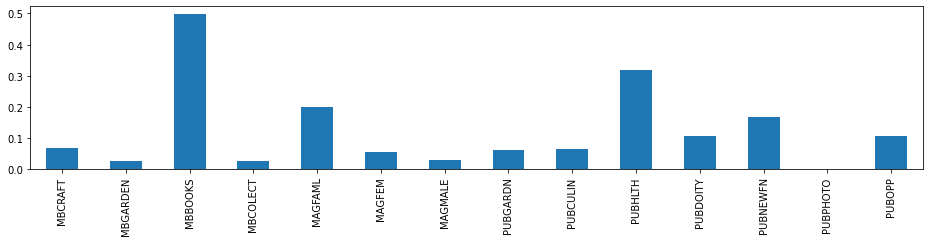

In [20]:
data[mail_order].mean().plot(kind='bar', figsize=(16,3))

### Interests

In [21]:
data[interests] = data[interests].replace(" ", 0)
data[interests] = data[interests].replace("Y", 1)
data[interests].head()

,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0


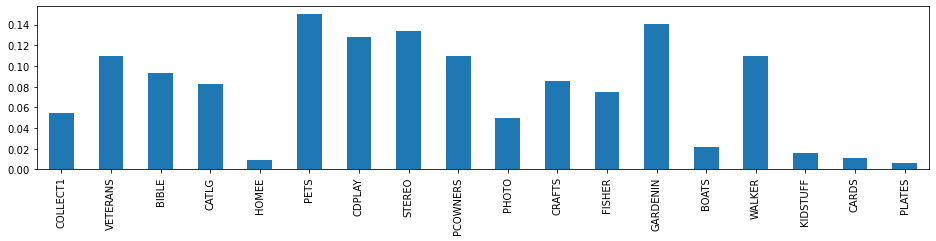

In [22]:
data[interests].mean().plot(kind='bar', figsize=(16,3))

### Neighborhood

In [23]:
data[neighborhood].head()

,latitude,longitude,POP901,POP902,POP903,POP90C1,AGE901,AGE903,AGE904,HHAGE1,HHP2,HV2,HU1,HU2,HU3,HU4,HU5,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,LFC4,LFC5,EC1,EC3,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6
0,41.8055,-89.7054,992,264,332,0,39,51,40,26,276,635,86,14,96,4,7,349,378,12883,28,4,51,1,64,44,120,10,0,0,0,18,39,0
1,34.2619,-118.5820,3611,940,998,99,34,43,32,12,360,5218,96,4,97,3,9,1026,1037,36175,6,2,66,3,81,57,160,5,0,0,0,8,15,0
2,36.3698,-80.7101,7001,2040,2669,0,35,46,37,25,254,546,78,22,93,7,18,292,340,11576,28,8,31,11,70,56,120,20,0,0,0,10,21,0
3,39.2601,-121.6923,640,160,219,0,32,44,34,25,283,1263,48,52,93,7,6,396,423,15130,22,14,26,20,68,45,120,12,0,0,0,13,23,0
4,25.6574,-80.3627,2520,627,761,99,33,50,36,31,323,594,90,10,97,3,0,293,321,9836,35,8,11,14,65,49,120,20,1,1,1,15,28,4


## Initialize map

In [24]:
#creating map for the whole dataset
location = []
heatmap = folium.Map(location=[48, -102], zoom_start=3)
for index, coordinate in data.iterrows():
    temp = [coordinate['latitude'],coordinate['longitude']]
    location.append(temp)
    
HeatMap(location,radius=10).add_to(heatmap)
heatmap.save("heatmap.html")

# Behavioural Analysis

<img src="images/promo_content.png" alt="Promo Content" width="500"/>

__Promo summary fields__  
`CARDPROM`	Lifetime number of card promotions received to date.  
`MAXADATE`	Date of the most recent promotion received.  
`NUMPROM`	    Lifetime number of promotions received to date.  
`CARDPM12`	Number of card promotions received in the last 12 months.  
`NUMPRM12`	Number of promotions received in the last 12 months.

__Gift summary fields__  
`RAMNTALL`	Dollar amount of lifetime gifts to date  
`NGIFTALL`	Number of lifetime gifts to date  
`CARDGIFT`	Number of lifetime gifts to card promotions to date  
`MINRAMNT`	Dollar amount of smallest gift to date  
`MINRDATE`	Date associated with the smallest gift to date  
`MAXRAMNT`	Dollar amount of largest gift to date  
`MAXRDATE`	Date associated with the largest gift to date  
`LASTGIFT`	Dollar amount of most recent gift  
`LASTDATE`	Date associated with the most recent gift  
`FISTDATE`	Date of first gift  
`NEXTDATE`	Date of second gift  
`TIMELAG`	Number of months between first and second gift  
`AVGGIFT`	Average dollar amount of gifts to date  

## Features

__Features of donors behaviour__
- For how long they have been donating in days (`loyalty`)
- Average number of gifts per year of donating (`avg_gifts_per_year`)
- Average dollar amount of gifts (`AVGGIFT`)
- Difference between the smallest and the largest gifts (`amount_delta`)
- Response rate to promos - # gifts / # promos received (`response_rate`)
- Number of gifts in 2015 and 2016 (`gifts_total_15`, `gifts_total_16`)
- Average dollar amount of gifts in 2015 and 2016 (`avg_gift_15`,`avg_gift_16`)
- Share of gift amount after promo with Christmas cards 2015-16 15XK+16XK (`share_xmas_cards`)
- Share of gift amount after promo with greeting cards 2015-16 15GK+16GK (`share_greet_cards`)
- Share of gift amount after promo with calendars 2015-16 15CC+16CC (`share_calendars`)
- Share of gifts to card promotions of all gifts CARDGIFT/NGIFTALL (`share_card_promo`)

In [25]:
# Donation values
# year 2016
ramnt_16 = data.loc[:,"RAMNT_3":"RAMNT_12"].columns
# year 2015
ramnt_15 = data.loc[:,"RAMNT_13":"RAMNT_22"].columns
# Total donation value for the year 2016 and 2015
data["money_total_16"] = data[ramnt_16].sum(axis=1)
data["money_total_15"] = data[ramnt_15].sum(axis=1)
# Total number of donations for the year 2016 and 2015
data["gifts_total_16"] = data[ramnt_16].count(axis=1)
data["gifts_total_15"] = data[ramnt_15].count(axis=1)

In [26]:
# Average gifts in 2015 / 2016
data["avg_gift_15"] = data.money_total_15 / data.gifts_total_15
data["avg_gift_16"] = data.money_total_16 / data.gifts_total_16

In [27]:
# Loyalty - time between first and last donation
data["LASTDATE"] = pd.to_datetime(data["LASTDATE"], format="%Y-%m-%d")
data["FISTDATE"] = pd.to_datetime(data["FISTDATE"], format="%Y-%m-%d")
data["loyalty"] = data["LASTDATE"] - data["FISTDATE"]
data["loyalty"] = data["loyalty"].dt.days +1

In [28]:
# Rounded up years of donating (ex, donated once - 1y, donated twice with difference 1.2ys - 2ys)
data["years_donating"] = np.ceil(data["loyalty"] / 365)
# Average number of gifts per year of donating
data["avg_gifts_per_year"] = data.NGIFTALL / data.years_donating

In [29]:
# difference between the smallest and the largest gifts
data["amount_delta"] = data.MAXRAMNT - data.MINRAMNT

In [30]:
# Response rate to promos
data["response_rate"] = data.NGIFTALL / data.NUMPROM

In [31]:
# Share of gift amount after promo with Christmas cards 2015-16 15XK+16XK
data["share_xmas_cards"] = (data.RAMNT_12.fillna(0) + data.RAMNT_22.fillna(0)) / (data.money_total_15 + data.money_total_16)
# -//- Greeting cards (GK)
data["share_greet_cards"] = (data.RAMNT_8.fillna(0) + data.RAMNT_18.fillna(0)) / (data.money_total_15 + data.money_total_16)
# -//- Calendars (CC)
data["share_calendars"] = (data.RAMNT_9.fillna(0) + data.RAMNT_19.fillna(0)) / (data.money_total_15 + data.money_total_16)
# -//- Notepads (X1, G1)
data["share_notepads"] = (data.RAMNT_11.fillna(0) + data.RAMNT_21.fillna(0) 
                           + data.RAMNT_7.fillna(0) + data.RAMNT_17.fillna(0)) / (data.money_total_15 + data.money_total_16)
# -//- Labels only (WL, LL)
data["share_labels"] = (data.RAMNT_10.fillna(0) + data.RAMNT_20.fillna(0) +
                       data.RAMNT_6.fillna(0) + data.RAMNT_16.fillna(0)) / (data.money_total_15 + data.money_total_16)

# Share of gifts to card promo
data["share_card_promo"] = data.CARDGIFT / data.NGIFTALL

In [32]:
behaviour = ["loyalty", "avg_gifts_per_year", "AVGGIFT", "amount_delta", "response_rate", "gifts_total_15",
             "gifts_total_16", "avg_gift_15", "avg_gift_16", 
             "share_xmas_cards", "share_greet_cards", "share_calendars", "share_notepads", "share_labels",
             'share_card_promo']

In [33]:
data[behaviour].head()

,loyalty,avg_gifts_per_year,AVGGIFT,amount_delta,response_rate,gifts_total_15,gifts_total_16,avg_gift_15,avg_gift_16,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels,share_card_promo
0,2222.0,4.428571,7.741935,7.0,0.418919,4,1,10.75,10.0,0.000000,0.000000,0.000000,0.207547,0.396226,0.451613
1,792.0,1.000000,15.666667,15.0,0.093750,1,1,12.00,25.0,0.000000,0.000000,0.675676,0.000000,0.324324,0.333333
2,2161.0,4.500000,7.481481,14.0,0.428571,4,1,8.50,11.0,0.422222,0.177778,0.000000,0.000000,0.200000,0.518519
3,3226.0,1.777778,6.812500,9.0,0.242424,5,2,9.00,10.0,0.153846,0.000000,0.000000,0.492308,0.200000,0.437500
4,6151.0,2.176471,6.864865,12.0,0.327434,1,1,10.00,15.0,0.000000,0.600000,0.000000,0.000000,0.000000,0.216216


## Cleaning

#### Null values

In [34]:
data[behaviour].isna().mean()

loyalty               0.000021
avg_gifts_per_year    0.000021
AVGGIFT               0.000000
amount_delta          0.000000
response_rate         0.000000
gifts_total_15        0.000000
gifts_total_16        0.000000
avg_gift_15           0.226460
avg_gift_16           0.253113
share_xmas_cards      0.015071
share_greet_cards     0.015071
share_calendars       0.015071
share_notepads        0.015071
share_labels          0.015071
share_card_promo      0.000000
dtype: float64

Investigating why `loyalty` and `avg_gift_per_year` have null values

In [35]:
data[data.loyalty.isna()]

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2,latitude,longitude,male,female,couple,age,urbanicity,ses,money_total_16,money_total_15,gifts_total_16,gifts_total_15,avg_gift_15,avg_gift_16,loyalty,years_donating,avg_gifts_per_year,amount_delta,response_rate,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels,share_card_promo
83217,83217,2006-01-01,,2,IA,51030,,,NaT,0,,X,,,XXXX,R2,0,,,,,0,1.0,M,7.0,3,1,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,31,34,30,5,2,2,,,,NaN,,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,,,1250,368,446,0,0,99,50,50,99,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,34,43,46,36,46,49,28,33,42,25,11,19,21,17,13,11,8,11,16,32,25,17,26,9,24,15,37,48,30,12,4,70,6,5,19,194,279,92,91,2,3,2,1,0,0,0,544,589,2,1,83,17,96,4,5,40,83,75,36,91,9,4,1,3,10,11,2,23,58,18,0,0,0,0,1,7,23,57,0,1,62,60,62,15,4,3,0,3,13,2,1,1,2,6,22,61,7720.0,391.0,624.0,314,390,371,421,14581,21,21,11,23,18,2,0,0,4,12,20,13,26,22,2,0,0,5,35,3,59,7,28,72,8,71,13,0,0,0,0,0,6,9,5,2,19,20,1,72,68,77,59,74,56,80,62,80,99,1,11,12,4,9,15,0,2,9,13

In [36]:
data = data.drop([83217, 93811])

Drop those rows as they are the only once that don't have first date of donations, which `loyalty` is based on.  
The rest of missing values for "behaviour" fiels are filled with 0.

In [37]:
data[behaviour] = data[behaviour].fillna(0)
selected = data[behaviour+general+interests.to_list()+mail_order.to_list()+neighborhood]
selected[behaviour].head()

,loyalty,avg_gifts_per_year,AVGGIFT,amount_delta,response_rate,gifts_total_15,gifts_total_16,avg_gift_15,avg_gift_16,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels,share_card_promo
0,2222.0,4.428571,7.741935,7.0,0.418919,4,1,10.75,10.0,0.000000,0.000000,0.000000,0.207547,0.396226,0.451613
1,792.0,1.000000,15.666667,15.0,0.093750,1,1,12.00,25.0,0.000000,0.000000,0.675676,0.000000,0.324324,0.333333
2,2161.0,4.500000,7.481481,14.0,0.428571,4,1,8.50,11.0,0.422222,0.177778,0.000000,0.000000,0.200000,0.518519
3,3226.0,1.777778,6.812500,9.0,0.242424,5,2,9.00,10.0,0.153846,0.000000,0.000000,0.492308,0.200000,0.437500
4,6151.0,2.176471,6.864865,12.0,0.327434,1,1,10.00,15.0,0.000000,0.600000,0.000000,0.000000,0.000000,0.216216


#### Outliers

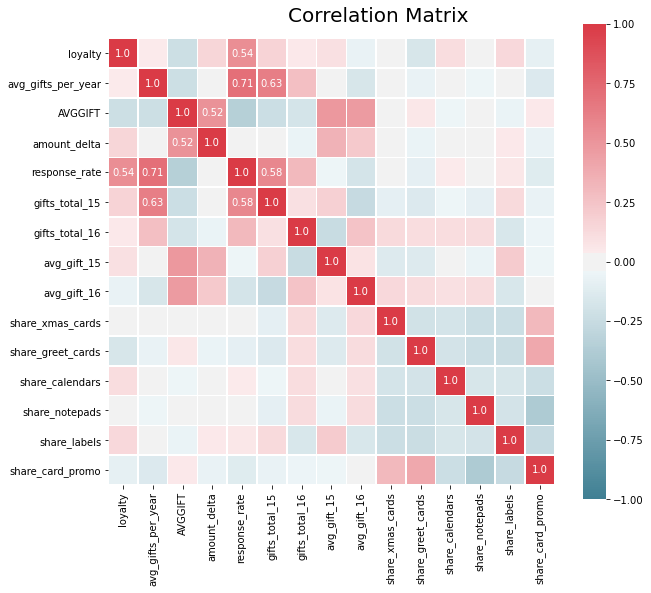

In [38]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(selected[behaviour].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [39]:
# Remove because it correlates with response_rate (valid) and gifts_total_15 (coincidence)
behaviour.remove('avg_gifts_per_year')

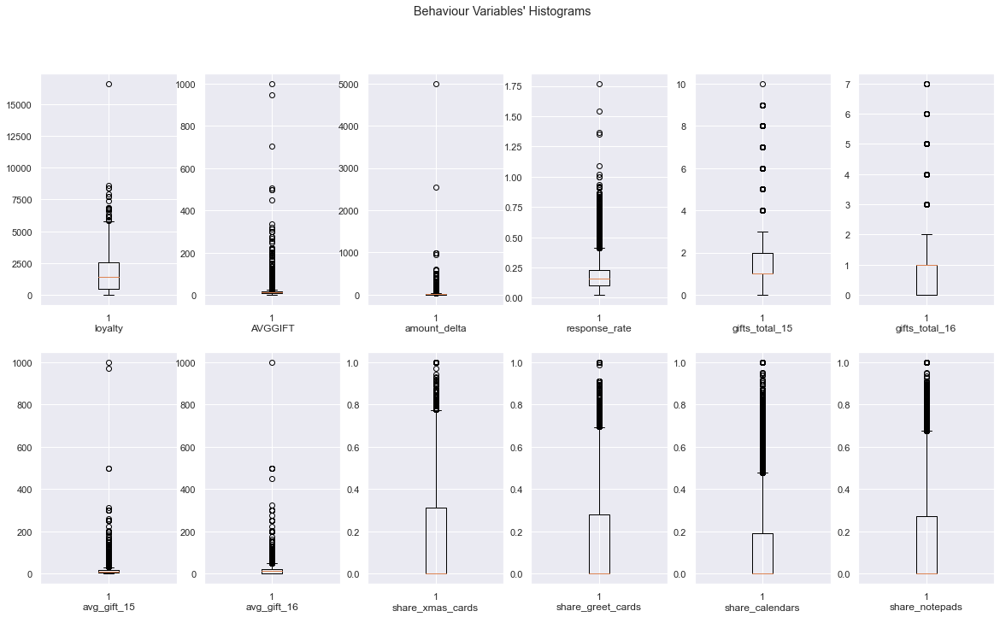

In [40]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, 6, figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), behaviour): # Notice the zip() function and flatten() method
    ax.boxplot(selected[behaviour][feat])
    ax.set_title(feat, y=-0.13)
    
# Layout
# Add a centered title to the figure:
title = "Behaviour Variables' Histograms"

plt.suptitle(title)

plt.show()

In [41]:
filters = (
    (selected['loyalty']<=6000)
    &
    (selected['amount_delta']<=350)
    &
    (selected['AVGGIFT']<=200)
    &
    (selected['response_rate']<1)
    &
    (selected['avg_gift_15']<=200)
    &
    (selected['avg_gift_16']<=200)
)

filtered = selected[filters]

print('Percentage of data kept after removing outliers:', np.round(filtered.shape[0] / selected.shape[0], 4))

Percentage of data kept after removing outliers: 0.9992


In [42]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
normalized = filtered.copy()
# metrics like "share of christmas cards" don't need to be normalized, they vary between 0 and 1
to_normalize = ["loyalty", "AVGGIFT", "amount_delta", "response_rate", "gifts_total_15",
             "gifts_total_16", "avg_gift_15", "avg_gift_16"]
normalized[to_normalize] = scaler.fit_transform(normalized[to_normalize])

In [43]:
normalized[behaviour].head()

,loyalty,AVGGIFT,amount_delta,response_rate,gifts_total_15,gifts_total_16,avg_gift_15,avg_gift_16,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels,share_card_promo
0,0.376122,0.032490,0.023490,0.434397,0.4,0.142857,0.05375,0.050,0.000000,0.000000,0.000000,0.207547,0.396226,0.451613
1,0.133954,0.072370,0.050336,0.075815,0.1,0.142857,0.06000,0.125,0.000000,0.000000,0.675676,0.000000,0.324324,0.333333
2,0.365792,0.031179,0.046980,0.445041,0.4,0.142857,0.04250,0.055,0.422222,0.177778,0.000000,0.000000,0.200000,0.518519
3,0.546147,0.027813,0.030201,0.239766,0.5,0.285714,0.04500,0.050,0.153846,0.000000,0.000000,0.492308,0.200000,0.437500
5,0.087384,0.057692,0.020134,0.098460,0.2,0.000000,0.07750,0.000,0.000000,0.483871,0.000000,0.000000,0.516129,0.750000


## Clustering

In [44]:
behaviour1 = ["loyalty",  "AVGGIFT", "response_rate", "gifts_total_15",
             "gifts_total_16", "avg_gift_15", "avg_gift_16"]
behaviour2 = [ "share_xmas_cards", "share_greet_cards", "share_calendars", "share_notepads", "share_labels"]

### behaviour1

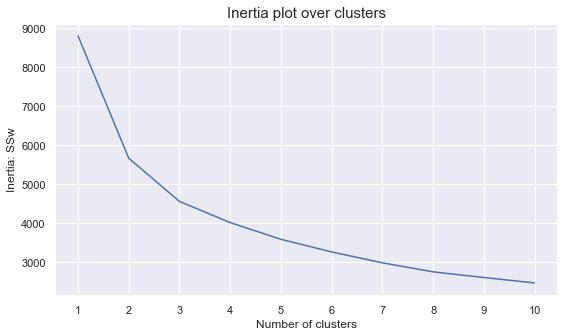

In [45]:
from sklearn.cluster import  KMeans
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(normalized[behaviour1])
    inertia.append(kmclust.inertia_)
    
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.xticks(range(10) , range(1,11))
plt.show()

In [46]:
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(normalized[behaviour1])
labeled = pd.concat((filtered.reset_index(drop=True), pd.Series(km_labels, name='label_1')), axis=1)
labeled_norm = pd.concat((normalized.reset_index(drop=True), pd.Series(km_labels, name='label_1')), axis=1)
c_sum = labeled.groupby('label_1').mean().reset_index()
# Preview average values of fields that were used to create clusters
c_sum[["label_1"]+behaviour1]

,label_1,loyalty,AVGGIFT,response_rate,gifts_total_15,gifts_total_16,avg_gift_15,avg_gift_16
0,0,574.263778,15.970943,0.116380,1.035162,0.915849,10.464283,13.779853
1,1,2705.342311,11.729236,0.208803,1.303274,0.957621,12.698545,12.111858
2,2,1693.147694,8.512926,0.299455,3.923215,1.586687,9.862739,8.634926


In [47]:
# Preview average values of all fields based on clusters
c_sum

,label_1,loyalty,avg_gifts_per_year,AVGGIFT,amount_delta,response_rate,gifts_total_15,gifts_total_16,avg_gift_15,avg_gift_16,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels,share_card_promo,NUMCHLD,INCOME,WEALTH1,HIT,WEALTH2,male,female,couple,age,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,latitude,longitude,POP901,POP902,POP903,POP90C1,AGE901,AGE903,AGE904,HHAGE1,HHP2,HV2,HU1,HU2,HU3,HU4,HU5,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,LFC4,LFC5,EC1,EC3,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6
0,0,574.263778,1.717644,15.970943,9.468196,0.116380,1.035162,0.915849,10.464283,13.779853,0.191738,0.217129,0.108402,0.166804,0.152954,0.568951,0.227124,4.076004,5.535089,2.796273,5.172808,0.430258,0.557626,0.015188,55.034968,0.057966,0.104234,0.093435,0.085226,0.010821,0.159830,0.144883,0.145058,0.127170,0.053796,0.086543,0.079103,0.141393,0.024209,0.109809,0.018305,0.010821,0.006541,0.058603,0.021334,0.456641,0.024341,0.180330,0.047255,0.030333,0.055047,0.057505,0.279011,0.092865,0.154606,0.001953,0.100459,39.903029,-92.813872,3346.881104,883.280898,1247.977327,60.849235,33.998639,44.472444,35.433902,23.476548,261.386471,1189.810913,69.062290,29.972389,89.976164,9.062883,13.058625,395.567327,438.334519,16053.491539,25.551437,6.124822,42.641492,10.667193,70.480213,53.641272,128.497509,12.702553,0.691117,1.207041,0.172560,15.381752,30.758434,1.291258
1,1,2705.342311,1.765689,11.729236,15.722098,0.208803,1.303274,0.957621,12.698545,12.111858,0.177777,0.134145,0.156032,0.178094,0.218311,0.549915,0.161455,3.741625,5.219883,4.170247,4.928232,0.413968,0.618270,0.025410,62.281593,0.048211,0.113918,0.092201,0.077489,0.007503,0.136573,0.111515,0.120454,0.094546,0.046335,0.080302,0.066704,0.139679,0.018552,0.111632,0.013100,0.010199,0.004719,0.080185,0.033997,0.573459,0.036253,0.235984,0.071921,0.029923,0.078456,0.078573,0.380792,0.130008,0.198353,0.003458,0.120571,40.124675,-92.119162,3098.989273,831.182849,1173.733478,56.396090,35.116380,45.917793,36.553149,25.953841,257.776355,1089.837402,70.619325,28.703145,90.038950,9.280971,14.478943,382.534803,427.228071,15599.281293,28.156971,6.046482,43.689663,10.746549,69.085754,52.214677,127.896398,12.887752,0.462384,0.854459,0.109053,15.795493,31.863017,1.266317
2,2,1693.147694,3.353802,8.512926,10.072672,0.299455,3.923215,1.586687,9.862739,8.634926,0.175626,0.145088,0.119398,0.140410,0.188632,0.516344,0.195477,3.654256,5.104686,2.984924,4.757877,0.384247,0.618117,0.030663,59.265799,0.058452,0.113645,0.093203,0.085282,0.008816,0.151846,0.117797,0.132490,0.093011,0.047975,0.095183,0.079532,0.139709,0.018589,0.107576,0.016226,0.012712,0.006452,0.067714,0.024594,0.452472,0.023381,0.178932,0.048805,0.025169,0.054044,0.055768,0.298454,0.092117,0.138750,0.002747,0.089498,40.105555,-91.440998,3324.928197,883.260700,1251.722818,56.754312,34.459563,45.194519,35.933819,24.932861,258.961032,1060.330842,69.565862,29.501086,89.796729,9.265875,14.074422,374.191453,416.391913,15008.141945,27.249521,6.162387,42.302159,10.938291,69.388527,52.582790,126.902070,13.183915,0.610515,1.084323,0.145522,15.651846,31.463268,1.278459


In [48]:
# Share of people in each cluster
labeled.label_1.value_counts(normalize=True)

0    0.477899
1    0.357903
2    0.164198
Name: label_1, dtype: float64

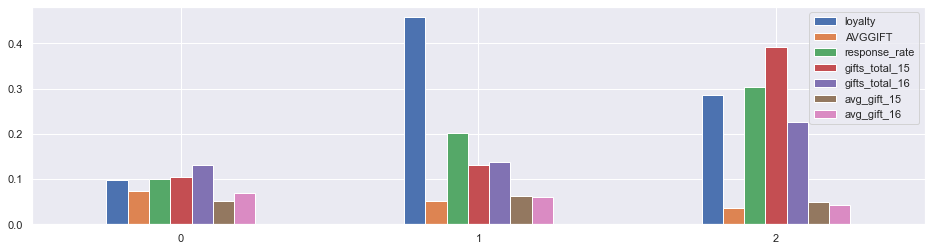

In [49]:
c_sum1 = labeled_norm.groupby('label_1').mean().reset_index()
c_sum1[behaviour1].plot(kind='bar', figsize=(16,4), rot=0)

### behaviour2

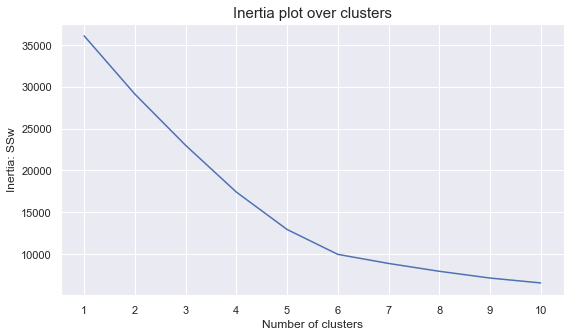

In [50]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(normalized[behaviour2])
    inertia.append(kmclust.inertia_)
    
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.xticks(range(10) , range(1,11))
plt.show()

In [51]:
number_clusters = 6
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(normalized[behaviour2])
labeled = pd.concat((labeled, pd.Series(km_labels, name='label_2')), axis=1)
labeled_norm = pd.concat((labeled_norm, pd.Series(km_labels, name='label_2')), axis=1)
c_sum = labeled.groupby('label_2').mean().reset_index()
# Preview average values of fields that were used to create clusters
c_sum[["label_2"]+behaviour2]

,label_2,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels
0,0,0.053587,0.043581,0.027814,0.764793,0.044486
1,1,0.053659,0.048454,0.710363,0.053680,0.059386
2,2,0.044546,0.830172,0.021128,0.027056,0.026303
3,3,0.800879,0.038909,0.027689,0.030365,0.034736
4,4,0.060648,0.044757,0.035140,0.071678,0.724386
5,5,0.164808,0.143341,0.098293,0.112892,0.133147


Interpretation example  
Label X:  
- share_xmas_cards = 0.69 - In the last two years, 69% of all donation amount ($) are responses to Christmas card promos  
- share_card_promo = 0.72 - During all time, 72% of donations are responses to card promotions

In [52]:
# Preview average values of all fields based on clusters
c_sum

,label_2,loyalty,avg_gifts_per_year,AVGGIFT,amount_delta,response_rate,gifts_total_15,gifts_total_16,avg_gift_15,avg_gift_16,share_xmas_cards,share_greet_cards,share_calendars,share_notepads,share_labels,share_card_promo,NUMCHLD,INCOME,WEALTH1,HIT,WEALTH2,male,female,couple,age,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,latitude,longitude,POP901,POP902,POP903,POP90C1,AGE901,AGE903,AGE904,HHAGE1,HHP2,HV2,HU1,HU2,HU3,HU4,HU5,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,LFC4,LFC5,EC1,EC3,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,label_1
0,0,1498.779302,1.696374,14.406341,12.505167,0.154695,1.008389,1.075108,9.669438,16.058221,0.053587,0.043581,0.027814,0.764793,0.044486,0.374145,0.200392,3.864583,5.258363,3.147001,4.911422,0.410349,0.604312,0.016856,57.874425,0.048060,0.099255,0.092434,0.073148,0.007526,0.135947,0.118071,0.122540,0.099961,0.045943,0.076833,0.068052,0.127323,0.017719,0.101842,0.014347,0.009016,0.004704,0.061074,0.028381,0.486005,0.026499,0.192160,0.054802,0.030968,0.064681,0.064524,0.311721,0.108350,0.172717,0.002038,0.093218,40.139941,-92.105274,3205.774912,849.381497,1199.883575,57.890474,34.155155,44.976088,35.715327,24.435045,261.032223,1108.823834,69.262015,29.905370,90.256370,8.914700,13.217013,382.110545,424.875108,15419.680517,26.568561,6.502313,42.031517,11.452215,69.713289,52.946296,127.706625,13.169737,0.580321,1.030733,0.142611,15.283575,30.741827,1.245786,0.509839
1,1,1771.392781,1.681492,13.314798,13.327107,0.166046,1.076530,1.031075,10.742792,15.896648,0.053659,0.048454,0.710363,0.053680,0.059386,0.432744,0.168404,3.768676,5.247291,3.580486,4.926880,0.444991,0.567362,0.017082,60.749411,0.047288,0.114746,0.086277,0.076916,0.008010,0.145532,0.119089,0.127485,0.099209,0.049990,0.079714,0.073248,0.138969,0.019687,0.112334,0.013221,0.008975,0.004246,0.070450,0.027794,0.532909,0.032716,0.215595,0.062536,0.030496,0.072862,0.070257,0.346362,0.120537,0.186354,0.002992,0.114457,39.791562,-93.013897,3173.435534,843.710288,1194.351091,57.955028,34.820787,45.528952,36.273789,25.390176,258.823779,1105.076047,70.284019,28.953870,90.068037,9.163675,14.083575,383.054430,426.065335,15550.136846,27.655954,6.107991,43.272920,10.729975,69.345493,52.436209,127.629319,13.069099,0.542945,0.966609,0.131345,15.778518,31.729010,1.289519,0.589655
2,2,963.123174,1.520789,16.098075,9.034066,0.132134,0.663791,1.011788,7.375684,16.532314,0.044546,0.830172,0.021128,0.027056,0.026303,0.785626,0.214658,4.085083,5.564408,3.064235,5.163166,0.420176,0.574699,0.017767,56.397221,0.054241,0.103528,0.098061,0.087213,0.011788,0.154352,0.145212,0.138379,0.126506,0.053558,0.084309,0.077817,0.146664,0.023234,0.113522,0.016315,0.010421,0.006834,0.060391,0.024601,0.456735,0.027505,0.192620,0.051508,0.026736,0.058512,0.063125,0.282139,0.102417,0.157769,0.002392,0.111472,40.064731,-92.289334,3254.331255,863.873580,1221.613565,60.336465,34.459127,44.850602,35.812335,24.006834,259.212522,1196.575724,69.321688,29.787990,90.062270,9.052789,13.269155,399.482361,443.891603,16493.227812,25.988554,5.838558,43.552661,10.335013,70.550782,53.501495,129.107201,12.434526,0.654224,1.152387,0.156231,15.511831,31.133595,1.267703,0.293500
3,3,1372.484048,1.671350,14.874838,11.700630,0.148761,0.813742,1.011867,7.945350,17.546019,0.800879,0.038909,0.027689,0.030365,0.034736,0.732505,0.198125,3.986161,5.482619,3.287815,5.088000,0.442858,0.557744,0.018746,57.482593,0.055809,0.107920,0.087798,0.083584,0.010491,0.150228,0.133975,0.139565,0.117551,0.050477,0.082380,0.070427,0.142231,0.024680,0.107232,0.018144,0.012125,0.006449,0.067074,0.024422,0.480867,0.028549,0.200877,0.057701,0.033967,0.055981,0.062344,0.315418,0.097859,0.175252,0.002494,0.105856,39.984161,-92.929634,3250.271133,859.447760,1220.722160,60.547425,34.418695,44.904721,35.827672,24.300456,259.347063,1197.643564,69.391779,29.5832

In [53]:
# Share of people in each cluster
labeled.label_2.value_counts(normalize=True)

5    0.353654
4    0.159090
0    0.133790
2    0.122797
3    0.121979
1    0.108689
Name: label_2, dtype: float64

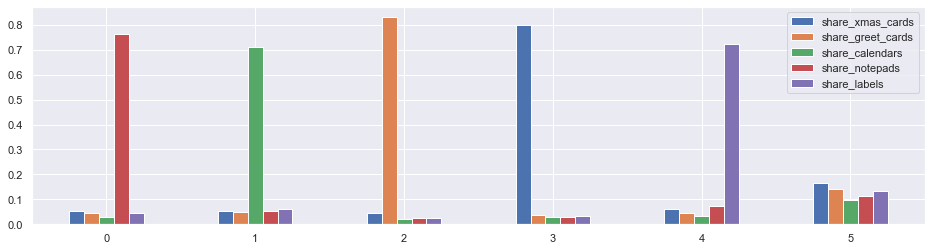

In [54]:
c_sum[behaviour2].plot(kind='bar', figsize=(16,4),  rot=0)

Critique. Most prabably there are many people who donated only once during that period and got 100% of their donations in a certain 'category'

In [55]:
print(f"Share of people who donated only once in 2015-2016 is {selected[(selected.gifts_total_15 + selected.gifts_total_16) == 1].shape[0] / selected.shape[0]:5.1%}")

Share of people who donated only once in 2015-2016 is 27.4%


In [56]:
print(f"Share of people who donated once in 2015 and once in 2016 is {selected[(selected.gifts_total_15 == 1) & (selected.gifts_total_16 == 1)].shape[0] / selected.shape[0]:5.1%}")

Share of people who donated once in 2015 and once in 2016 is 17.3%


In [57]:
print(f"Share of people who didn't donate in 2015-2016 is {selected[(selected.gifts_total_15 == 0) & (selected.gifts_total_16 == 0)].shape[0] / selected.shape[0]:5.1%}. We might want to exclude them from analysis")

Share of people who didn't donate in 2015-2016 is  1.5%. We might want to exclude them from analysis


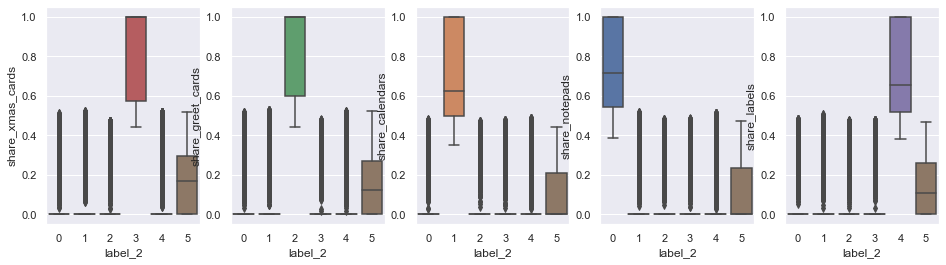

In [58]:
f, axes = plt.subplots(1, 5, figsize=(16,4))

for i in range(len(behaviour2)):
    sns.boxplot(y=behaviour2[i], x="label_2", data=labeled[behaviour2+["label_2"]],  orient='v' , ax=axes[i])

In [59]:
# New contigency table
labeled.groupby(['label_1', 'label_2'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('label_2', 'label_1', 0)

label_1,0,1,2
label_2,,,
0,6936,5135,684
1,4739,5136,487
2,8462,3054,191
3,6854,4413,362
4,6882,7063,1222
5,11688,9320,12708


In [60]:
# Centroids of the concatenated cluster labels
df_centroids = labeled_norm.groupby(['label_1', 'label_2'])\
    [behaviour].mean()

In [61]:
from sklearn.cluster import  AgglomerativeClustering
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

In [62]:
hclust.distances_

array([0.31740407, 0.33741905, 0.35923907, 0.36183587, 0.38027808,
       0.39266927, 0.39356491, 0.42551759, 0.43493996, 0.49237781,
       0.51721307, 0.55369146, 1.00740213, 1.33908813, 1.48170671,
       1.6184693 , 1.69024425])

from scipy.cluster.hierarchy import dendrogram

# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 2.3
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
#plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [63]:
labeled.groupby(['label_1', 'label_2'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('label_2', 'label_1', 0)

label_1,0,1,2
label_2,,,
0,6936,5135,684
1,4739,5136,487
2,8462,3054,191
3,6854,4413,362
4,6882,7063,1222
5,11688,9320,12708


In [64]:
# Neighborhood profile

In [66]:
# if we would do geoclustering, this would be useful.
# idea from:
# https://towardsdatascience.com/data-visualization-with-python-folium-maps-a74231de9ef7

#get packages for states
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f'{url}/us-states.json'

#the following setup identifies label (0 - 0) -- unresponsive and responds to nothing neighborhood density and loyalty to PVA
m = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=labeled,
    columns=['STATE', 'POP901'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Hood density (%)'
).add_to(m)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data=labeled,
    columns=['STATE', 'loyalty'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='loyalty'
).add_to(m)

folium.LayerControl().add_to(m)


m

# map to identify how well are our clusters distributed within the country

In [67]:
#only for the first partition

In [68]:
# shall create a map to represent each cluster combination seperately

#initialize
first_partition_map = folium.Map(location=[48, -102],
                    zoom_start = 5) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_1',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_1']):
    tdata.append([[row['latitude'], row['longitude'], row['label_1']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(first_partition_map)

# export
first_partition_map.save("first_partition_map.html")

# Display the map
first_partition_map

In [69]:
# fiure out the second partition

In [70]:
# shall create a map to represent each cluster combination seperately

#initialize
second_partition_map = folium.Map(location=[48, -102],
                    zoom_start = 5) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_2',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_2']):
    tdata.append([[row['latitude'], row['longitude'], row['label_2']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(second_partition_map)

# export
second_partition_map.save("second_partition_map.html")

# Display the map
second_partition_map

In [71]:
#combined

In [73]:
# shall create a map to represent each cluster combination seperately

#initialize
cluster_map = folium.Map(location=[48, -102],
                    zoom_start = 5) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_1',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_1','label_2']):
    tdata.append([[row['latitude'], row['longitude'], row['label_2']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(cluster_map)

# export
cluster_map.save("Clustertest_map.html")

# Display the map
cluster_map

Selected variables are split in the following categories:
- Donors
   - Information on donors' _interests_ // s.e.s. and urbanization
- Neighborhood
   - Households: number of people, families, households; people per household, average/median age
   - Real estate: average home value, vacant/occupied housing units, rental/owner occupied
   - Income: average income per household/family/capita; share of households on social security/public assistance, below poverty level; employment, education
   - Military service: share of adults/F/M in military service, Veterans
    
    
    after split we group target customers and send them 2 gifts we 
    for 0 - it depends
    for second split we would

In [ ]:
#vars selected:
#neighborhood = ['POP901','POP902','POP903','POP90C1',
#                'AGE901','AGE903','AGE904','HHAGE1',
#                'HHP2','HV2','HU1','HU2','HU3','HU4','HU5',
#                'IC3','IC4','IC5',
#                'HHAS1','HHAS2','HHAS3','HHAS4',
#                'LFC4','LFC5',
#                'EC1','EC3',
#                'AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']

POP901	     Number of Persons 
AGE903         Median Age of Adults 25 or Older  
HHAGE1	Percent Households w/ Person 65+  # this would be a complementary field for descriptive stats  
HV2	 Average Home Value in hundreds  
IC5	 Per Capita Income  
AFC1 Percent Adults in Active Military Service  

In [74]:
def statistics(variable):
    if variable.dtypes == "int64" or variable.dtype == "float64":
        return pd.DataFrame([[variable.name, np.mean(variable), np.std(variable), np.median(variable), np.var(variable)]], 
                            columns = ["Variable", "Mean", "Standard Deviation", "Median", "Variance"]).set_index("Variable")
    else:
        return pd.DataFrame(variable.value_counts())
def graph_histo(x):
    if x.dtype == "int64" or x.dtype == "float64":
        # Select size of bins by getting maximum and minimum and divide the substraction by 10
        size_bins = 10
        # Get the title by getting the name of the column
        title = "Distribution plot"
        #Assign random colors to each graph
        color_kde = list(map(float, np.random.rand(3,)))
        color_bar = list(map(float, np.random.rand(3,)))

        # Plot the displot
        sns.distplot(x, bins=size_bins, kde_kws={"lw": 1.5, "alpha":0.8, "color":color_kde},
                       hist_kws={"linewidth": 1.5, "edgecolor": "grey",
                                "alpha": 0.4, "color":color_bar})
        # Customize ticks and labels
        plt.xticks(size=14)
        plt.yticks(size=14);
        plt.ylabel("Frequency", size=16, labelpad=15);
        # Customize title
        plt.title(title, size=18)
        # Customize grid and axes visibility
        plt.grid(False);
        plt.gca().spines["top"].set_visible(False);
        plt.gca().spines["right"].set_visible(False);
        plt.gca().spines["bottom"].set_visible(False);
        plt.gca().spines["left"].set_visible(False);   
    else:
        x = pd.DataFrame(x)
        # Plot       
        sns.catplot(x=x.columns[0], kind="count", palette="spring", data=x)
        # Customize title
        title = x.columns[0]
        plt.title(title, size=18)
        # Customize ticks and labels
        plt.xticks(size=14)
        plt.yticks(size=14);
        plt.xlabel("")
        plt.ylabel("Counts", size=16, labelpad=15);        
        # Customize grid and axes visibility
        plt.gca().spines["top"].set_visible(False);
        plt.gca().spines["right"].set_visible(False);
        plt.gca().spines["bottom"].set_visible(False);
        plt.gca().spines["left"].set_visible(False);
        

In [75]:
neighborhood.remove('latitude')
neighborhood.remove('longitude')

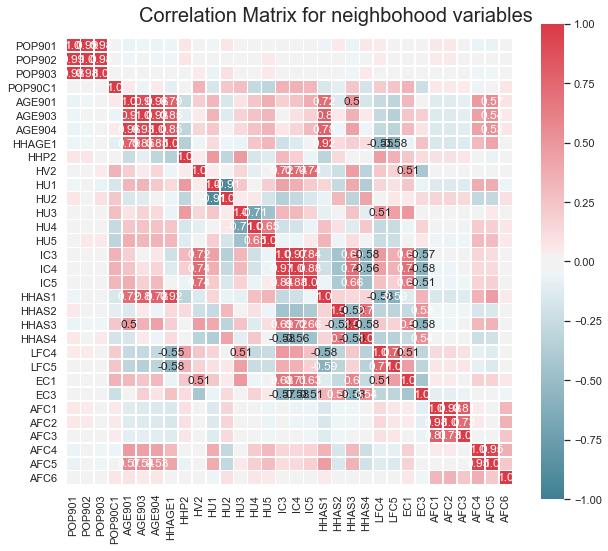

In [76]:

# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(labeled[neighborhood].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix for neighbohood variables", fontsize=20)

plt.show()

In [ ]:
# we can see that neighbohood variables are correlated within their groups, therefor
# shall be inspected on a group level

In [77]:
clust_0 = pd.DataFrame(labeled[labeled['label_1']== 0])
clust_1 = pd.DataFrame(labeled[labeled['label_1']== 1])
clust_2 = pd.DataFrame(labeled[labeled['label_1']== 2])

In [78]:
# EC3 Percent Adults 25+ w/ some High School

In [79]:
#statistics(clust_1['EC3'])
statistics(clust_0['HOMEOWNR'])

,HOMEOWNR
1,25239
0,20322


In [80]:
statistics(clust_1['HOMEOWNR'])

,HOMEOWNR
1,19002
0,15119


In [81]:
statistics(clust_2['HOMEOWNR'])

,HOMEOWNR
1,8082
0,7572


In [82]:
statistics(clust_2['EC3'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
EC3,13.183915,7.44183,13.0,55.38083


In [83]:
statistics(clust_1['EC3'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
EC3,12.887752,7.464257,12.0,55.715134


# (insignificant) a little higher Percent Adults 25+ w/ some High School for cluster 3

In [84]:
#will split and inspect separately

#hh_age_dif = ['AGE901','AGE903','AGE904','HHAGE1']
#hood_income = ['IC3','IC4','IC5']
#social_needs =['HHAS1','HHAS2','HHAS3','HHAS4']
# 'EC3' Percent Adults 25+ w/ some High School
#military_hood = ['AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']



# 'EC3' Percent Adults 25+ w/ some High School

# will inspect if there's any difference in distribution when it comes to age

In [85]:
hh_age_dif = ['AGE901','AGE903','AGE904','HHAGE1']

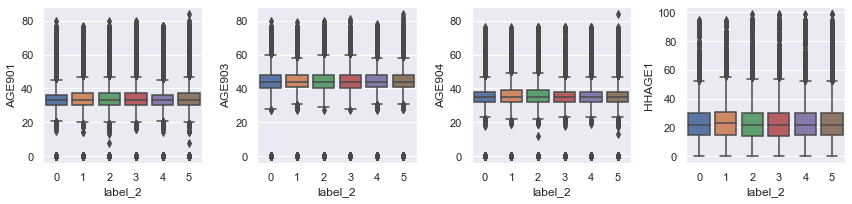

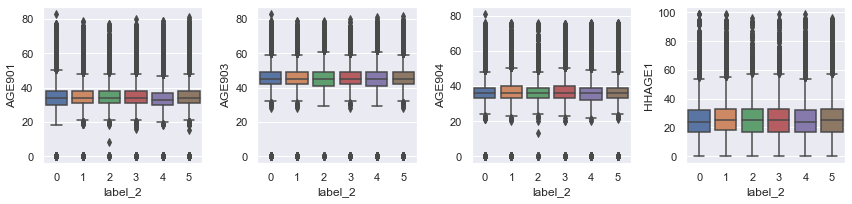

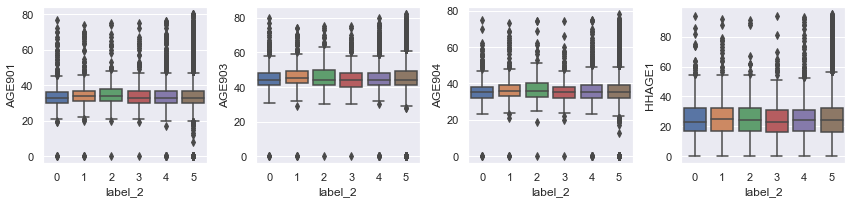

In [86]:
f, axes = plt.subplots(1, 4, figsize=(12,3))


for i in range(len(hh_age_dif)):
    sns.boxplot(y=hh_age_dif[i], x="label_2", data=clust_0[hh_age_dif+["label_2"]], ax=axes[i])
plt.tight_layout()

f, axes = plt.subplots(1, 4, figsize=(12,3))


for i in range(len(hh_age_dif)):
    sns.boxplot(y=hh_age_dif[i], x="label_2", data=clust_1[hh_age_dif+["label_2"]], ax=axes[i])
plt.tight_layout()

f, axes = plt.subplots(1, 4, figsize=(12,3))


for i in range(len(hh_age_dif)):
    sns.boxplot(y=hh_age_dif[i], x="label_2", data=clust_2[hh_age_dif+["label_2"]], ax=axes[i])
plt.tight_layout()

In [87]:
# NO SIGNIFICANCE

In [88]:
# will check if there's any diff in terms of income

In [89]:
hood_income = ['IC3','IC4','IC5']

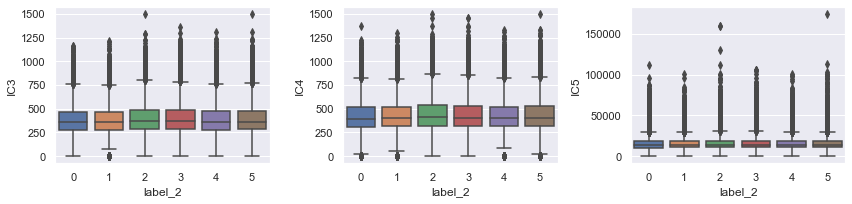

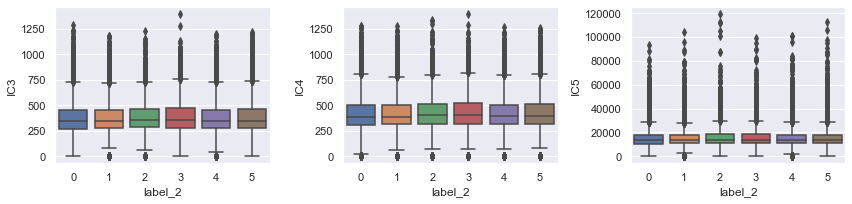

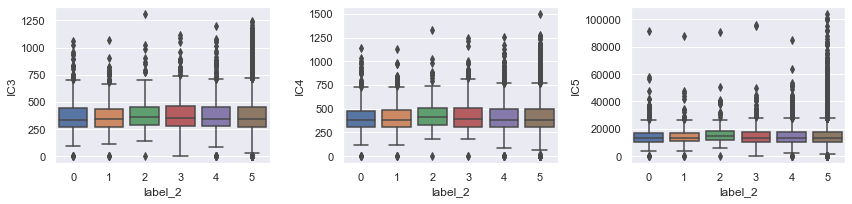

In [90]:
f, axes = plt.subplots(1, 3, figsize=(12,3))

for i in range(len(hood_income)):
    sns.boxplot(y=hood_income[i], x="label_2", data=clust_0[hood_income+["label_2"]], ax=axes[i])
plt.tight_layout()

f, axes = plt.subplots(1, 3, figsize=(12,3))

for i in range(len(hood_income)):
    sns.boxplot(y=hood_income[i], x="label_2", data=clust_1[hood_income+["label_2"]], ax=axes[i])
plt.tight_layout()

f, axes = plt.subplots(1, 3, figsize=(12,3))

for i in range(len(hood_income)):
    sns.boxplot(y=hood_income[i], x="label_2", data=clust_2[hood_income+["label_2"]], ax=axes[i])
plt.tight_layout()

In [91]:
# no significance

In [92]:
# inspect hood social_needs
social_needs =['HHAS1','HHAS2','HHAS3','HHAS4']

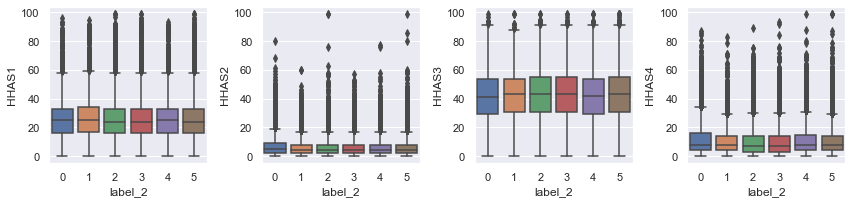

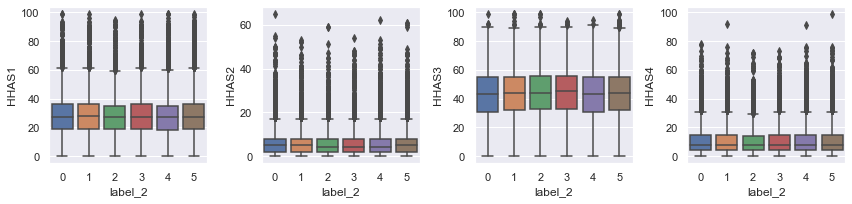

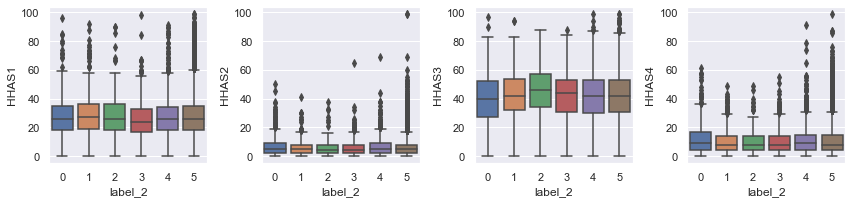

In [93]:

f, axes = plt.subplots(1, 4, figsize=(12,3))

for i in range(len(social_needs)):
    sns.boxplot(y=social_needs[i], x="label_2", data=clust_0[social_needs+["label_2"]], ax=axes[i])
plt.tight_layout()
f, axes = plt.subplots(1, 4, figsize=(12,3))

for i in range(len(social_needs)):
    sns.boxplot(y=social_needs[i], x="label_2", data=clust_1[social_needs+["label_2"]], ax=axes[i])
plt.tight_layout()
f, axes = plt.subplots(1, 4, figsize=(12,3))

for i in range(len(social_needs)):
    sns.boxplot(y=social_needs[i], x="label_2", data=clust_2[social_needs+["label_2"]], ax=axes[i])
plt.tight_layout()

In [94]:
# no significance

In [95]:
# inspect military_hood 
military_hood = ['AFC1', 'AFC2', 'AFC3', 'AFC4', 'AFC5', 'AFC6']

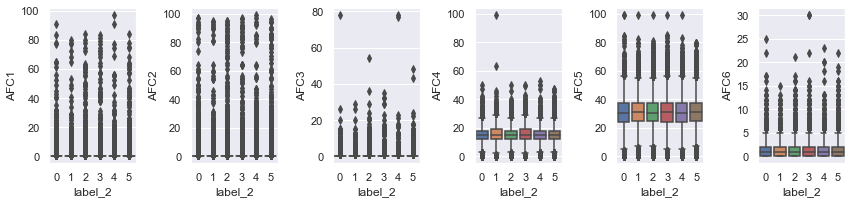

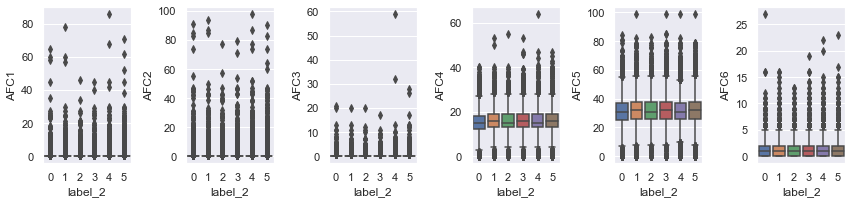

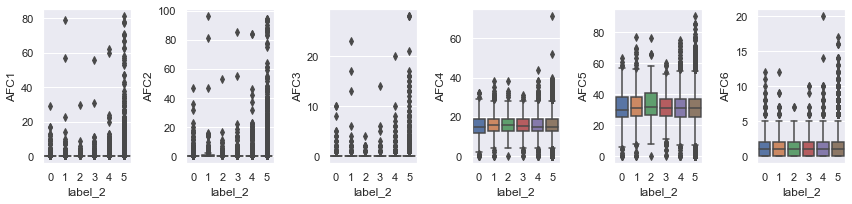

In [96]:
f, axes = plt.subplots(1, 6, figsize=(12,3))
for i in range(len(military_hood)):
    sns.boxplot(y=military_hood[i], x="label_2", data=clust_0[military_hood+["label_2"]], ax=axes[i])
plt.tight_layout()

f, axes = plt.subplots(1, 6, figsize=(12,3))
for i in range(len(military_hood)):
    sns.boxplot(y=military_hood[i], x="label_2", data=clust_1[military_hood+["label_2"]], ax=axes[i])
plt.tight_layout()

f, axes = plt.subplots(1, 6, figsize=(12,3))
for i in range(len(military_hood)):
    sns.boxplot(y=military_hood[i], x="label_2", data=clust_2[military_hood+["label_2"]], ax=axes[i])
plt.tight_layout()

In [97]:
#vars selected :
#AGE904 Average Age of Population
#IC3   Average Household Income in hundreds
#HHAS3 Percent Households w/ Interest, Rental or Dividend Income
#AFC4   Percent Adult Veterans Age 16+
#EC3 Percent Adults 25+ w/ some High School
clust_0 = clust_0.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
clust_1 = clust_1.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
clust_2 = clust_2.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
hoodie =['Average_Age','Avg_HH_Income','Rental_or_Dividend_Income','Adult_Veterans','Hood_Education_lvl']

In [98]:
# select main variables to use

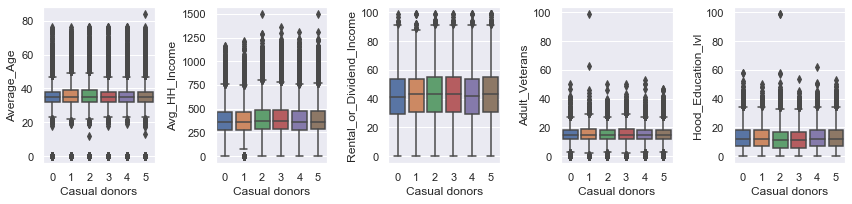

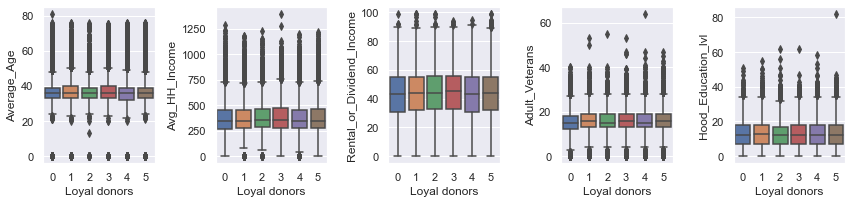

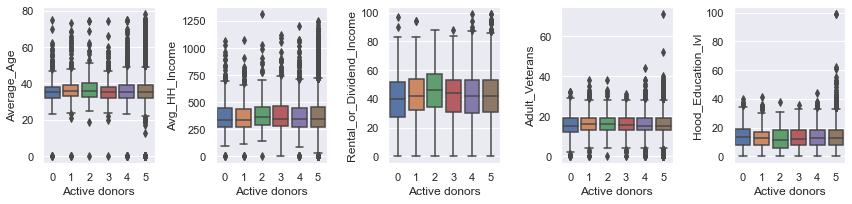

In [99]:
f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_0[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Casual donors')

plt.tight_layout()


f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_1[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Loyal donors')
plt.tight_layout()    
f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_2[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Active donors')
plt.tight_layout()


In [100]:
# check male vs female employment in hood
statistics(labeled['LFC4'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
LFC4,69.80188,14.982419,72.0,224.472874


In [101]:
statistics(labeled['LFC5'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
LFC5,52.956889,13.741724,54.0,188.834992


In [102]:
labeled = labeled.rename(columns={'LFC4': 'Adult_Males_Employed', 'LFC5': 'Adult_Females_Employed'})

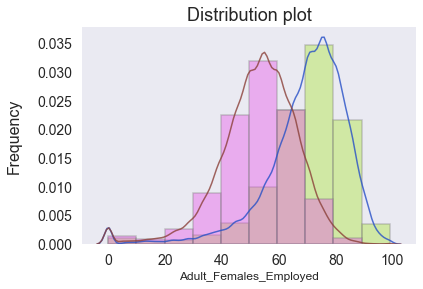

In [103]:
graph_histo(labeled['Adult_Males_Employed'])
graph_histo(labeled['Adult_Females_Employed'])